<a href="https://colab.research.google.com/github/MohitMotivaras/ML-Project-On-Health-Insurance-Cross-Sell-Prediction/blob/main/Health_Insurance_Cross_Sell_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Problem Statement**

Our client, an insurance company specializing in health insurance, seeks assistance in developing a predictive model. The objective is to determine whether policyholders from the previous year would express interest in purchasing vehicle insurance offered by the company.

Insurance policies provide financial guarantees against specified losses, damages, illnesses, or deaths in exchange for regular premium payments. For instance, a customer might pay an annual premium for health insurance to cover potential hospitalization costs up to a certain limit. The company manages risk by collecting premiums from many customers, with only a fraction requiring payouts in any given period.

Similarly, vehicle insurance requires customers to pay premiums to cover potential damages resulting from accidents. Predicting customer interest in this type of insurance enables the company to tailor its communication strategies effectively, optimize business operations, and enhance revenue generation.

The model-building process involves analyzing customer data encompassing demographics (such as gender, age, and region), vehicle details (including vehicle age and previous damage history), policy specifics (like premium amount and sourcing channel), and potentially other relevant factors. By leveraging this dataset, the goal is to develop a robust predictive model that accurately identifies which customers are likely to be interested in purchasing vehicle insurance.

# **Attribute Information**

1. id : Unique ID for the customer

2. Gender : Gender of the customer

3. Age : Age of the customer

4. Driving_License 0 : Customer does not have DL, 1 : Customer already has DL

5. Region_Code : Unique code for the region of the customer

6. Previously_Insured : 1 : Customer already has Vehicle Insurance, 0 : Customer doesn't have Vehicle Insurance

7. Vehicle_Age : Age of the Vehicle

8. Vehicle_Damage :1 : Customer got his/her vehicle damaged in the past. 0 : Customer didn't get his/her vehicle damaged in the past.

9. Annual_Premium : The amount customer needs to pay as premium in the year

10. PolicySalesChannel : Anonymized Code for the channel of outreaching to the customer ie. Different Agents, Over Mail, Over Phone, In Person, etc.

11. Vintage : Number of Days, Customer has been associated with the company

12. Response : 1 : Customer is interested, 0 : Customer is not interested

# **Introduction**

Insurance represents a contractual agreement where individuals obtain protection against various risks such as damage, financial loss, illness, or death from an insurance company in exchange for payment of a specified premium. This project utilizes an insurance details dataset comprising 381,109 rows and 12 features, with a categorical dependent variable "Response" indicating customer interest in vehicle insurance.

Initially, we conducted thorough checks for null values and duplicates in the dataset, finding none, thus obviating the need for data cleaning. Subsequently, numerical columns were normalized to ensure uniform scaling across the dataset.

In Exploratory Data Analysis (EDA), we categorized Age into YoungAge, MiddleAge, and OldAge categories. Additionally, we derived insights from Region_Code and Policy_Sales_Channel through categorization to extract meaningful information. Independent features were explored using various plots.

For feature selection, we employed Kendall's rank correlation coefficient for numerical features and the Mutual Information technique for categorical features.

In our predictive modeling phase, we utilized supervised machine learning algorithms including Decision Tree Classifier, AdaBoost, LightGBM, BaggingRegressor, NaiveBayes, and Logistic Regression. Hyperparameter tuning techniques were applied to enhance accuracy and mitigate overfitting.

Without further delay, let's proceed with our analysis.

# **Installing Reliance**

In [ ]:
!pip uninstall scikit-learn -y
!pip install -U scikit-learn

Found existing installation: scikit-learn 1.2.2
Uninstalling scikit-learn-1.2.2:
  Successfully uninstalled scikit-learn-1.2.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 20.2 MB/s eta 0:00:00


# **Importing Libraries**

In [ ]:
# Basic
import numpy as np
import pandas as pd

# Plotation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

# ML Models
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
import lightgbm as lgb

# Evaluation Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import log_loss

# Hyper Parameter Tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV

# Miscellaneous
import time
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Reading Dataset**

In [ ]:
dataset = pd.read_csv('/content/drive/MyDrive/TRAIN-HEALTH INSURANCE CROSS SELL PREDICTION.csv')

# **Data Wrangling**

Data wrangling encompasses the systematic process of refining and harmonizing intricate and disorderly datasets to facilitate streamlined access and analysis. This involves transforming and mapping data from its original raw state into a more structured format, thereby enabling efficient data consumption, organization, and subsequent analysis.

# **Health Insurance Dataset**

**Columns:**
- ID: Unique identifier for the Customer.

- Age: Age of the Customer.

- Gender: Gender of the Customer.

- Driving_License: 0 for customer not having DL, 1 for customer having DL.

- Region_Code: Unique code for the region of the customer.

- Previously_Insured: 0 for customer not having vehicle insurance, 1 for customer having vehicle insurance.

- Vehicle_Age: Age of the vehicle.

- Vehicle_Damage: Customer got his/her vehicle damaged in the past. 0 : Customer didn't get his/her vehicle damaged in the past.

- Annual_Premium: The amount customer needs to pay as premium in the year.

- Policy_Sales_Channel: Anonymized Code for the channel of outreaching to the customer ie. Different Agents, Over Mail, Over Phone, In Person, etc.

- Vintage: Number of Days, Customer has been associated with the company.

- Response (Dependent Feature): 1 for Customer is interested, 0 for Customer is not interested.

In [ ]:
dataset.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


In [ ]:
dataset.shape

(381109, 12)

In [ ]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
id,381109.0,190555.000000,110016.836208,1.0,95278.0,190555.0,285832.0,381109.0
Age,381109.0,38.822584,15.511611,20.0,25.0,36.0,49.0,85.0
Driving_License,381109.0,0.997869,0.046110,0.0,1.0,1.0,1.0,1.0
Region_Code,381109.0,26.388807,13.229888,0.0,15.0,28.0,35.0,52.0
Previously_Insured,381109.0,0.458210,0.498251,0.0,0.0,0.0,1.0,1.0
Annual_Premium,381109.0,30564.389581,17213.155057,2630.0,24405.0,31669.0,39400.0,540165.0
Policy_Sales_Channel,381109.0,112.034295,54.203995,1.0,29.0,133.0,152.0,163.0
Vintage,381109.0,154.347397,83.671304,10.0,82.0,154.0,227.0,299.0
Response,381109.0,0.122563,0.327936,0.0,0.0,0.0,0.0,1.0


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  object 
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  object 
 7   Vehicle_Damage        381109 non-null  object 
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


Checking for Duplicate Data:

In [ ]:
dataset[dataset.duplicated()]

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response


Checking for Null Values:

In [ ]:
dataset.isna().sum()

id                      0
Gender                  0
Age                     0
Driving_License         0
Region_Code             0
Previously_Insured      0
Vehicle_Age             0
Vehicle_Damage          0
Annual_Premium          0
Policy_Sales_Channel    0
Vintage                 0
Response                0
dtype: int64

# **Observations:**

1. Our dataset comprises 381,109 rows and 12 columns, containing detailed information regarding insurance attributes.

2. The dataset is devoid of any Null Values, ensuring completeness and reliability in our analysis.

3. Among the dataset's features, 4 are numeric, providing quantitative insights into various insurance parameters.

4. Additionally, 5 features are categorical, capturing qualitative attributes that enrich our understanding of customer profiles and behaviors.

5. The dependent feature of interest is a categorical column labeled "Response," which indicates customer interest in vehicle insurance.

These points collectively provide a comprehensive overview of the dataset's characteristics and form the foundational understanding necessary for further data exploration and modeling.

# **Data Cleaning and Refactoring**

**Finding Outliers**

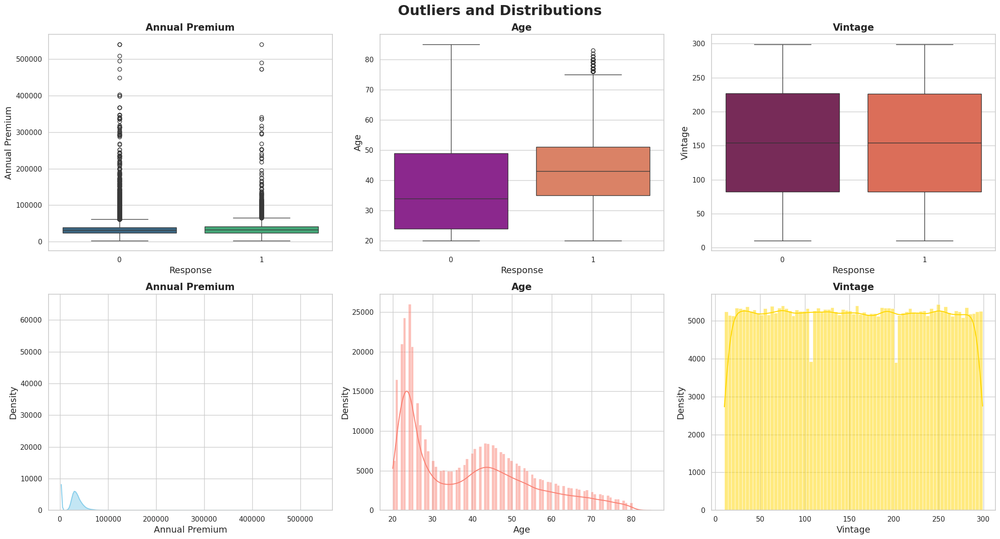

In [ ]:
def show_outliers(df):
    # Set a colorful Seaborn style
    sns.set(style='whitegrid')

    fig, axes = plt.subplots(2, 3, figsize=(22,12))

    # Boxplots with colorful palettes
    sns.boxplot(ax=axes[0][0], y='Annual_Premium', x='Response', data=df, palette='viridis')
    axes[0][0].set_xlabel('Response', fontsize=14)
    axes[0][0].set_ylabel('Annual Premium', fontsize=14)
    axes[0][0].set_title('Annual Premium', fontsize=15, fontweight='bold')

    sns.boxplot(ax=axes[0][1], y='Age', x='Response', data=df, palette='plasma')
    axes[0][1].set_xlabel('Response', fontsize=14)
    axes[0][1].set_ylabel('Age', fontsize=14)
    axes[0][1].set_title('Age', fontsize=15, fontweight='bold')

    sns.boxplot(ax=axes[0][2], y='Vintage', x='Response', data=df, palette='rocket')
    axes[0][2].set_xlabel('Response', fontsize=14)
    axes[0][2].set_ylabel('Vintage', fontsize=14)
    axes[0][2].set_title('Vintage', fontsize=15, fontweight='bold')

    # Distribution plots with colorful palettes
    sns.histplot(ax=axes[1][0], x=df['Annual_Premium'], kde=True, color='skyblue')
    axes[1][0].set_xlabel('Annual Premium', fontsize=14)
    axes[1][0].set_ylabel('Density', fontsize=14)
    axes[1][0].set_title('Annual Premium', fontsize=15, fontweight='bold')

    sns.histplot(ax=axes[1][1], x=df['Age'], kde=True, color='salmon')
    axes[1][1].set_xlabel('Age', fontsize=14)
    axes[1][1].set_ylabel('Density', fontsize=14)
    axes[1][1].set_title('Age', fontsize=15, fontweight='bold')

    sns.histplot(ax=axes[1][2], x=df['Vintage'], kde=True, color='gold')
    axes[1][2].set_xlabel('Vintage', fontsize=14)
    axes[1][2].set_ylabel('Density', fontsize=14)
    axes[1][2].set_title('Vintage', fontsize=15, fontweight='bold')

    plt.suptitle('Outliers and Distributions', fontsize=22, fontweight='bold')
    plt.tight_layout()
    plt.show()

show_outliers(dataset)



- The plot indicates that the distribution of Annual Premium is positively skewed, with higher values concentrated towards the right tail of the distribution.

- Additionally, the plot suggests that Vintage follows an approximately uniform distribution, where values are evenly spread across the range.

- Observing the Age column, it is noted that there are outliers present. However, these outliers are not treated as they are not expected to significantly impact the outcome of our analysis.

# **Outlier Treatment and Feature Scaling**

- For Outlier treatment we will be applying quantile method.
- For feature Scaling we will be using MinMaxScaler technique for Normlization.

In [ ]:
def outlier_treatment(df):
    Q1=df['Annual_Premium'].quantile(0.25)
    Q3=df['Annual_Premium'].quantile(0.75)
    IQR=Q3-Q1

    Lower_Whisker = Q1-1.5*IQR
    Upper_Whisker = Q3+1.5*IQR
    df['Annual_Premium_Treated'] = np.where(df['Annual_Premium']>Upper_Whisker, Upper_Whisker, df['Annual_Premium'])

def scale_features(df):
    scaler = MinMaxScaler()

    df['Annual_Premium_Treated'] = scaler.fit_transform(df['Annual_Premium_Treated'].values.reshape(-1,1))
    df['Vintage_Treated'] = scaler.fit_transform(df['Vintage'].values.reshape(-1,1))

outlier_treatment(dataset)
scale_features(dataset)

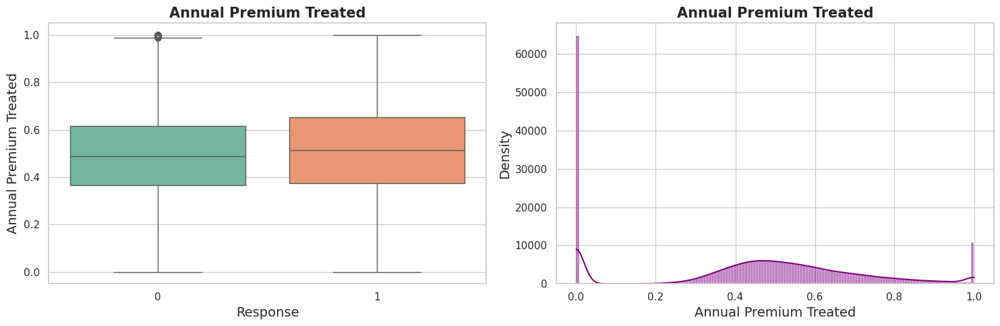

In [ ]:
def show_ann_prem_outliers(df):
    fig, axes = plt.subplots(1, 2, figsize=(15,5))

    # Boxplot of Annual_Premium_Treated by Response with colorful palette
    sns.boxplot(ax=axes[0], y='Annual_Premium_Treated', x='Response', data=df, palette='Set2')
    axes[0].set_xlabel('Response', fontsize=14)
    axes[0].set_ylabel('Annual Premium Treated', fontsize=14)
    axes[0].set_title('Annual Premium Treated', fontsize=15, fontweight='bold')

    # Distribution plot of Annual_Premium_Treated with colorful palette
    sns.histplot(ax=axes[1], x=df['Annual_Premium_Treated'], kde=True, color='purple')
    axes[1].set_xlabel('Annual Premium Treated', fontsize=14)
    axes[1].set_ylabel('Density', fontsize=14)
    axes[1].set_title('Annual Premium Treated', fontsize=15, fontweight='bold')

    plt.tight_layout()
    plt.show()

# Assuming 'dataset' is your DataFrame and 'Annual_Premium_Treated' is a column in it
show_ann_prem_outliers(dataset)



- From the above plots, it is evident that there are no outliers present in the Annual Premium variable.

# **Exploratory Data Analysis**

In [ ]:
def show_distribution_numerical_features(df):
    fig, axes = plt.subplots(2, 2, figsize=(20, 15))

    # Countplot for Age
    sns.countplot(ax=axes[0][0], x='Age', data=df, hue='Response', palette='pastel')
    axes[0][0].set_xlabel('Age', fontsize=14)
    axes[0][0].set_ylabel('Count', fontsize=14)
    axes[0][0].set_title('Distribution of Age', fontsize=15, fontweight='bold')

    # Countplot for Region_Code
    sns.countplot(ax=axes[0][1], x='Region_Code', data=df, hue='Response', palette='Set2')
    axes[0][1].set_xlabel('Region Code', fontsize=14)
    axes[0][1].set_ylabel('Count', fontsize=14)
    axes[0][1].set_title('Distribution of Region Code', fontsize=15, fontweight='bold')

    # Countplot for Policy_Sales_Channel
    sns.countplot(ax=axes[1][0], x='Policy_Sales_Channel', data=df, hue='Response', palette='Set3')
    axes[1][0].set_xlabel('Policy Sales Channel', fontsize=14)
    axes[1][0].set_ylabel('Count', fontsize=14)
    axes[1][0].set_title('Distribution of Policy Sales Channel', fontsize=15, fontweight='bold')

    # Histogram with hue for Vintage
    sns.histplot(ax=axes[1][1], x='Vintage', data=df, hue='Response', palette='Dark2', multiple='stack')
    axes[1][1].set_xlabel('Vintage', fontsize=14)
    axes[1][1].set_ylabel('Count', fontsize=14)
    axes[1][1].set_title('Distribution of Vintage', fontsize=15, fontweight='bold')

    plt.suptitle('Distribution of Numerical Features', fontsize=22, fontweight='bold')



In [ ]:
def show_violin_distribution(df):
    sns.catplot(y='Age', data=df, x='Response', kind='violin', palette='husl')
    plt.xlabel('Response', fontsize=14)
    plt.ylabel('Age', fontsize=14)
    plt.title('Age Distribution', fontsize=20, fontweight='bold')

    sns.catplot(y='Region_Code', data=df, x='Response', kind='violin', palette='husl')
    plt.xlabel('Response', fontsize=14)
    plt.ylabel('Region Code', fontsize=14)
    plt.title('Region Code Distribution', fontsize=20, fontweight='bold')

    sns.catplot(y='Policy_Sales_Channel', data=df, x='Response', kind='violin', palette='husl')
    plt.xlabel('Response', fontsize=14)
    plt.ylabel('Policy Sales Channel', fontsize=14)
    plt.title('Policy Sales Channel Distribution', fontsize=20, fontweight='bold')

In [ ]:
def convert_numerical_to_categorical(df):
    """
    Converts numerical features into categorical groups in the provided DataFrame.

    Parameters:
    df (DataFrame): Input DataFrame containing numerical features like 'Age' and 'Policy_Sales_Channel'.

    Returns:
    None. Modifies the input DataFrame by adding 'Age_Group' and 'Region_Code_Categorical' columns.
    """
    # Categorizing Age feature
    df['Age_Group'] = df['Age'].apply(lambda x: 'YoungAge' if 20 <= x <= 45 else 'MiddleAge' if 46 <= x <= 65 else 'OldAge')

    # Categorizing Policy_Sales_Channel feature
    x = df['Policy_Sales_Channel'].value_counts().apply(lambda count:
        'Channel_A' if count > 100000 else
        'Channel_B' if count > 74000 else
        'Channel_C' if count > 40000 else 'Other')

    res = dict(zip(x.index, x.values))
    df['Region_Code_Categorical'] = df['Policy_Sales_Channel'].map(res)

# Example usage:
convert_numerical_to_categorical(dataset)




In [ ]:
def show_distribution_num_to_cat(df):
    fig, axes = plt.subplots(1,3, figsize=(22,5))

    sns.countplot(ax = axes[0],x = 'Age_Group', data = df, hue='Response')
    axes[0].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0].set_title('Age', fontdict={'fontsize': 15})

    sns.countplot(ax = axes[1],x = 'Region_Code_Categorical', data = df, hue='Response')
    axes[1].set_xlabel(xlabel = 'Region_Code_Categorical', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1].set_title('Region_Code',fontdict={'fontsize': 15})

    sns.countplot(ax = axes[2],x = 'Policy_Sales_Channel', data = df, hue='Response')
    axes[2].set_xlabel(xlabel = 'Policy_Sales_Channel_Categorical', fontdict={'fontsize': 14})
    axes[2].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[2].set_title('Policy_Sales_Channel',fontdict={'fontsize': 15})

    plt.suptitle('Distribution of Categorical Features', fontsize = 22, fontweight = 'bold' )

In [ ]:
def show_distribution_num_to_cat(df):
    fig, axes = plt.subplots(1, 2, figsize=(22, 5))

    # Countplot for Age_Group
    sns.countplot(ax=axes[0], x='Age_Group', data=df, hue='Response', palette='Set2')
    axes[0].set_xlabel('Age Group', fontsize=14)
    axes[0].set_ylabel('Count', fontsize=14)
    axes[0].set_title('Age Distribution', fontsize=15)

    # Countplot for Region_Code_Categorical
    sns.countplot(ax=axes[1], x='Region_Code_Categorical', data=df, hue='Response', palette='Set2')
    axes[1].set_xlabel('Region Code Categorical', fontsize=14)
    axes[1].set_ylabel('Count', fontsize=14)
    axes[1].set_title('Region Code Distribution', fontsize=15)


    plt.show()



In [ ]:
def show_gender_response_relation(df):
    sns.catplot(x="Response", hue="Gender", kind="count",
                palette="pastel",
                data=df)
    plt.xlabel('Response', fontdict={'fontsize':12})
    plt.ylabel('Count',fontdict={'fontsize': 14})
    plt.title('Response V/S Gender', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def show_age_relations(df):
    fig, axes = plt.subplots(1,3, figsize=(25,8))
    sns.countplot(ax = axes[0],x="Response", hue="Age_Group", palette="pastel",
            data=df)
    axes[0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[0].set_title('Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.histplot(ax = axes[1],binwidth=0.5, x="Age_Group",
                 hue="Previously_Insured", data=df,
                 stat="count", multiple="stack")
    axes[1].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    axes[1].set_title('Age_Group V/S Previously_Insured', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.lineplot(ax = axes[2], x="Age",y="Annual_Premium_Treated",
                 data=df,hue="Gender")
    axes[2].set_xlabel(xlabel = 'Age', fontdict={'fontsize': 14})
    axes[2].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[2].set_title('Age V/S Annual Premium Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def vehicle_damage_distribution(df):
    fig = px.pie(df, values='Response', names='Vehicle_Damage', title='Vehicle Damage Distribution')
    fig.show()

In [ ]:
def show_vehicle_damage_relations(df):

    fig, axes = plt.subplots(1, 2, figsize=(22, 8))

    # Plotting the first subplot (left side)
    sns.pointplot(ax=axes[0], x="Vehicle_Damage", y="Response", hue="Vehicle_Age", data=df)
    axes[0].set_xlabel(xlabel='Vehicle_Damage', fontsize=14)
    axes[0].set_ylabel(ylabel='Response', fontsize=14)
    axes[0].set_title('Vehicle_Damage V/S Response', fontsize=15, fontweight='bold')

    # Plotting the second subplot (right side)
    sns.pointplot(ax=axes[1], x='Vehicle_Damage', y='Annual_Premium_Treated', data=df)
    axes[1].set_xlabel(xlabel='Vehicle_Damage', fontsize=14)
    axes[1].set_ylabel(ylabel='Annual_Premium_Treated', fontsize=14)
    axes[1].set_title('Vehicle_Damage V/S Annual_Premium_Treated', fontsize=15, fontweight='bold')

    plt.tight_layout()
    plt.show()



In [ ]:
def vehicle_age_distribution(df):
    plt.figure(figsize=(10, 8))
    sns.countplot(x = 'Vehicle_Age', hue='Response', data = df, palette="Dark2")
    plt.xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    plt.ylabel(ylabel = 'Count', fontdict={'fontsize': 14})
    plt.title('Vehicle_Age', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def show_vehicle_age_relation(df):
    fig, axes = plt.subplots(2,3, figsize=(22,15))

    sns.barplot(ax = axes[0][0], x = 'Vehicle_Age', y='Response', data = df)
    axes[0][0].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][0].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[0][1], y = 'Response', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data=df)
    axes[0][1].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][1].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[0][2], y = 'Response', x = 'Vehicle_Age', hue = 'Region_Code_Categorical', data=df)
    axes[0][2].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[0][2].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[0][2].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.pointplot(ax = axes[1][0], y = 'Response', x = 'Vehicle_Age', hue = 'Region_Code_Categorical', data=df )
    axes[1][0].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Response', fontdict={'fontsize': 14})
    axes[1][0].set_title('Vehicle_Age V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.boxplot(ax = axes[1][1], y = 'Annual_Premium_Treated', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data=df )
    axes[1][1].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][1].set_title('Vehicle_Age V/S Annual_Premium_Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.stripplot(ax = axes[1][2], y = 'Annual_Premium_Treated', x = 'Vehicle_Age', hue = 'Vehicle_Damage', data=df )
    axes[1][2].set_xlabel(xlabel = 'Vehicle_Age', fontdict={'fontsize': 14})
    axes[1][2].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][2].set_title('Vehicle_Age V/S Annual_Premium_Treated', fontdict={'fontsize': 15, 'fontweight':'bold'})



In [ ]:
def show_annual_premium_relation(df):
    fig, axes = plt.subplots(2,2, figsize=(15,12))

    sns.pointplot(ax = axes[0][0], x = 'Response', y = 'Annual_Premium_Treated', data = df)
    axes[0][0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0][0].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.violinplot(ax = axes[0][1], x = 'Response', y = 'Annual_Premium_Treated', data = df)
    axes[0][1].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[0][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0][1].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.swarmplot(ax = axes[1][0], x = 'Response', y = 'Annual_Premium_Treated', data = df[:1000])
    axes[1][0].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[1][0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][0].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.stripplot(ax = axes[1][1], x = 'Response', y = 'Annual_Premium_Treated', data = df)
    axes[1][1].set_xlabel(xlabel = 'Response', fontdict={'fontsize': 14})
    axes[1][1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1][1].set_title('Annual_Premium_Treated V/S Response', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def show_annual_premium_with_age_group(df):
    fig, axes = plt.subplots(1,2, figsize=(15,8))

    sns.barplot(ax = axes[0],y = 'Annual_Premium_Treated', x = 'Age_Group', data= df)
    axes[0].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[0].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[0].set_title('Annual_Premium_Treated V/S Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

    sns.violinplot(ax = axes[1], y = 'Annual_Premium_Treated', x = 'Age_Group', data= df)
    axes[1].set_xlabel(xlabel = 'Age_Group', fontdict={'fontsize': 14})
    axes[1].set_ylabel(ylabel = 'Annual_Premium_Treated', fontdict={'fontsize': 14})
    axes[1].set_title('Annual_Premium_Treated V/S Age_Group', fontdict={'fontsize': 15, 'fontweight':'bold'})

In [ ]:
def show_age_annual_premium_relation(df):

    plt.figure(figsize = (14,9))
    plt.hexbin(data=df, x='Age',y='Annual_Premium_Treated',gridsize = 30, cmap ='Greens')
    plt.title('Annual Premium V/S Age', fontdict={'fontsize': 15, 'fontweight':'bold'})
    plt.ylabel('Annual Premium Treated',fontdict={'fontsize': 14})
    plt.xlabel('Age', fontdict={'fontsize': 14})
    plt.show()


    fig = px.scatter(df, x="Age", y="Annual_Premium",
                    color="Region_Code_Categorical",
                    size_max=180,opacity=0.3, title='Age V/S Annual Premium')
    fig.show()


In [ ]:
def age_group_distribution(df):
    fig, axes = plt.subplots(1,3, figsize=(15,6))

    colors = sns.color_palette('pastel')[0:4]
    explode = (0.01, 0.25, 0.01)
    axes[0].pie( x= df.groupby('Age_Group')['Response'].sum(),explode=explode,
            labels=df['Age_Group'].unique(), colors=colors, autopct='%1.1f%%',
            shadow=True);
    axes[0].set_title('with Response', fontsize = 15, fontweight ='bold', pad=15)

    axes[1].pie(x=df.groupby('Age_Group')['Annual_Premium'].sum(),explode=explode,
            labels=df['Age_Group'].unique(), colors=colors, autopct='%1.1f%%',
            shadow=True);
    axes[1].set_title('with Annual_Premium', fontsize = 15, fontweight ='bold', pad=15)

    axes[2].pie(x=df.groupby('Age_Group')['Previously_Insured'].sum(),explode=explode,
            labels=df['Age_Group'].unique(), colors=colors, autopct='%1.1f%%',
            shadow=True);
    axes[2].set_title('with Previously_Insured', fontsize = 15, fontweight ='bold', pad=15)

    plt.suptitle('Age Group Distribution',fontsize = 20, fontweight ='bold')

In [ ]:
def show_region_code_distribution(df):
    # Define colors and explode settings for the pie charts
    colors = sns.color_palette('pastel')[0:4]
    explode = (0.01, 0.01, 0.01, 0.01)  # Assuming four categories, adjust if necessary

    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # First pie chart for 'Vintage'
    axes[0].pie(x=df.groupby('Region_Code_Categorical')['Vintage'].sum(),
                explode=explode,
                labels=df['Region_Code_Categorical'].unique(),
                colors=colors,
                autopct='%1.1f%%',
                shadow=True)
    axes[0].set_title('With Vintage', fontsize=15, fontweight='bold', pad=15)

    # Second pie chart for 'Annual_Premium_Treated'
    axes[1].pie(x=df.groupby('Region_Code_Categorical')['Annual_Premium_Treated'].sum(),
                explode=explode,
                labels=df['Region_Code_Categorical'].unique(),
                colors=colors,
                autopct='%1.1f%%',
                shadow=True)
    axes[1].set_title('With Annual Premium', fontsize=15, fontweight='bold', pad=15)

    # Supertitle for the entire figure
    plt.suptitle('Region Code Distribution', fontsize=15, fontweight='bold')

    # Show the plot
    plt.show()


In [ ]:
def count_each_categorical_feature(df):
    categorical_columns = ['Gender', 'Age_Group', 'Region_Code_Categorical', 'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage']

    # Define color palettes
    palettes = ['pastel', 'deep', 'muted', 'bright', 'dark', 'colorblind']

    fig, axes = plt.subplots(2, 6, figsize=(45, 15))

    for i in range(6):
        sns.countplot(data=df[df['Response'] == 1], x=categorical_columns[i], ax=axes[0][i], palette=palettes[i])
        axes[0][i].set_xlabel(xlabel=categorical_columns[i], fontdict={'fontsize': 14})
        axes[0][i].set_ylabel(ylabel='Count', fontdict={'fontsize': 14})
        axes[0][i].set_title(categorical_columns[i], fontdict={'fontsize': 15, 'fontweight': 'bold'})

        sns.countplot(data=df[df['Response'] == 0], x=categorical_columns[i], ax=axes[1][i], palette=palettes[i])
        axes[1][i].set_xlabel(xlabel=categorical_columns[i], fontdict={'fontsize': 14})
        axes[1][i].set_ylabel(ylabel='Count', fontdict={'fontsize': 14})
        axes[1][i].set_title(categorical_columns[i], fontdict={'fontsize': 15, 'fontweight': 'bold'})

    plt.tight_layout()
    plt.show()


# **Exploring the Numerical Features**

- We have 4 numerical features: Age, Policy_Sales_Channel, Region_Code, Vintage. Without any further delay, let's explore these features.

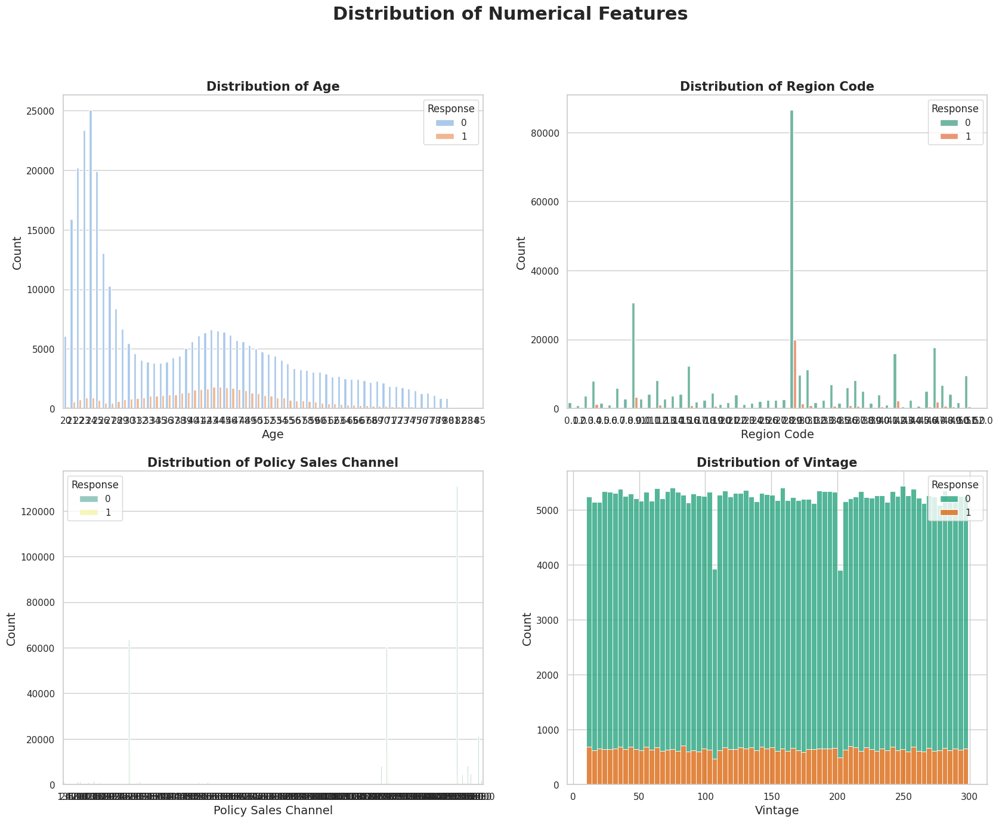

In [ ]:
show_distribution_numerical_features(dataset)

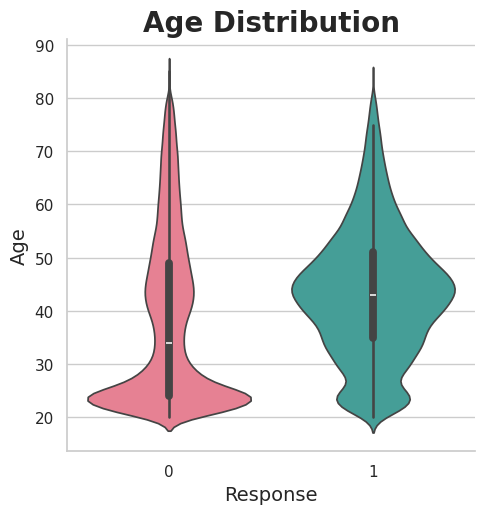

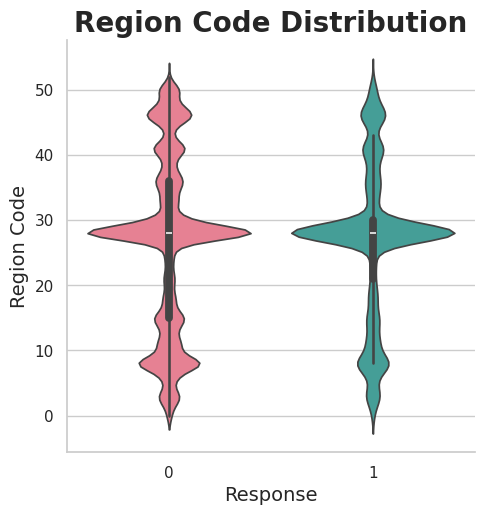

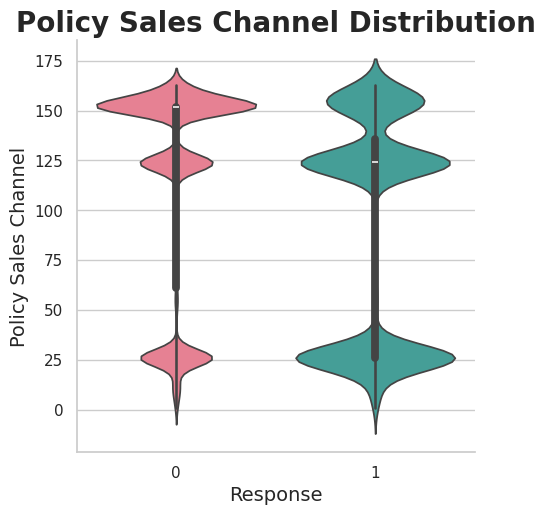

In [ ]:
show_violin_distribution(dataset)

From the above graphical representations, several conclusions can be drawn:
- **Age Feature:** Transforming Age into distinct categories such as YoungAge, MiddleAge, and OldAge.

- **Region Code:** Similarly, categorizing the Region Code variable to uncover regional patterns and insights.

- **Policy_Sales_Channel:** Categorizing the Policy_Sales_Channel to discern patterns in sales channel effectiveness or preference.

**Converting Numerical Columns to Categorical**

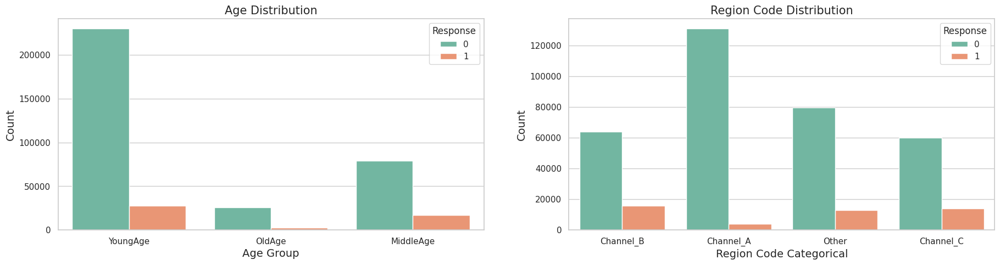

In [ ]:
show_distribution_num_to_cat(dataset)

**Observations:**

- We can see that Customers belonging to YoungAge group are more likely not interested in taking the vehicle insurance.
- Similarly, Channel_A Customers has the highest chances of not taking the vehicle insurance.

In [ ]:
dataset.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Annual_Premium_Treated,Vintage_Treated,Age_Group,Region_Code_Categorical
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1,0.638245,0.716263,YoungAge,Channel_B
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0,0.521510,0.598616,OldAge,Channel_B
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1,0.601797,0.058824,MiddleAge,Channel_B
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0,0.438540,0.667820,YoungAge,Channel_A
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0,0.419591,0.100346,YoungAge,Channel_A


# **Gender Distribution**

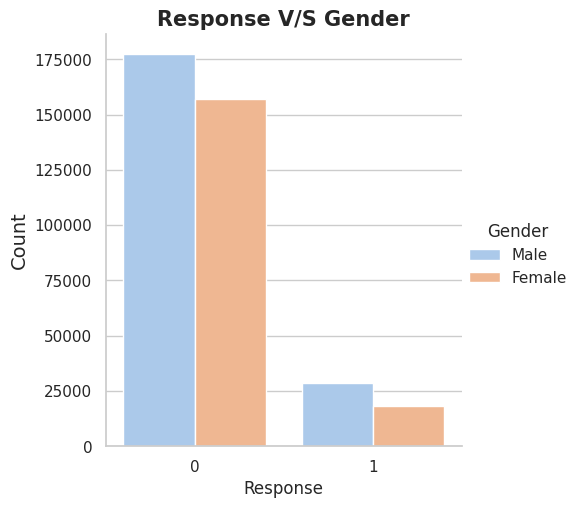

In [ ]:
show_gender_response_relation(dataset)

- Based on the plotted data, it is evident that the number of male customers in our dataset exceeds that of female customers.

# **Exploring the Age Feature**

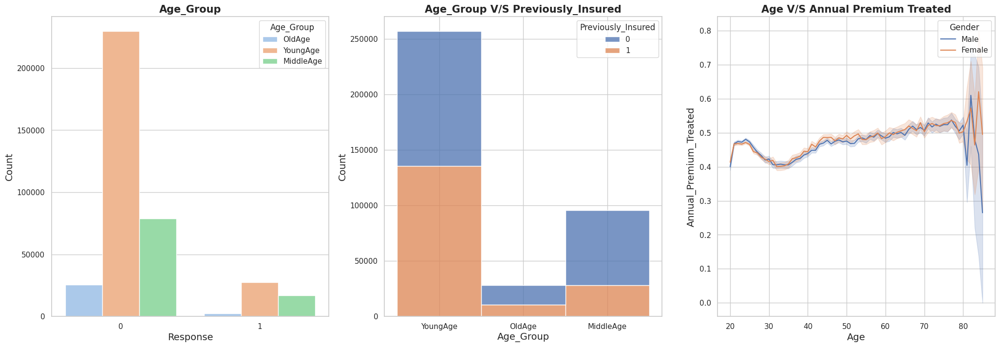

In [ ]:
show_age_relations(dataset)

**Observation:**

1. **From the first plot**, we observe the responses received from different age groups.

2. **The second plot** illustrates the distribution of customers across different age groups based on whether they have vehicle insurance or not. It indicates that:
   - Customers in the YoungAge and OldAge groups are equally likely to have or not have vehicle insurance.
   - Customers in the MiddleAge group show the highest likelihood of not having previously insured vehicle insurance.

3. **From the third plot**, we analyze the relationship between age and annual premium for both male and female customers.

# **Exploring Vehicle Damage**

In [ ]:
vehicle_damage_distribution(dataset)

**Observation:**
- As per the pie chart, the distribution of vehicle damage is 2.1%.

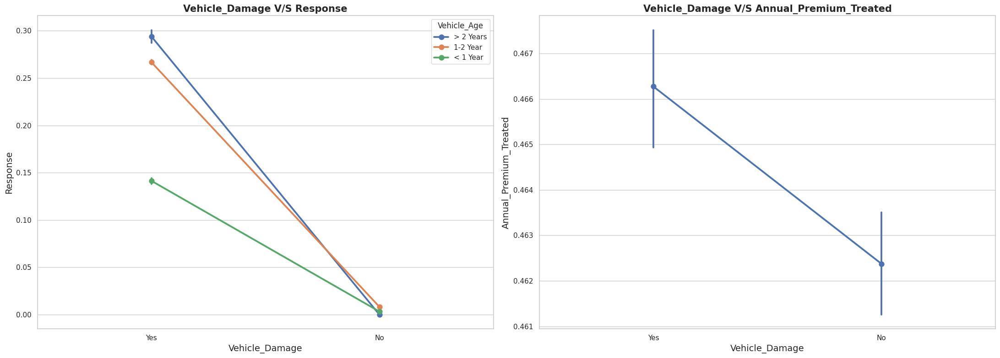

In [ ]:
show_vehicle_damage_relations(dataset)

**Observations:**
1. **From the first point plot:**
   - The chances of taking vehicle insurance are higher if the vehicle is damaged, regardless of the VehicleAge group.
   - Additionally, with the increase in vehicle age, the likelihood of taking vehicle insurance also increases.

2. **Regarding the second point plot:**
   - The plot indicates that the Annual_Premium is comparatively higher for customers with a damaged vehicle.

# **Exploring Vehicle Age Feature**

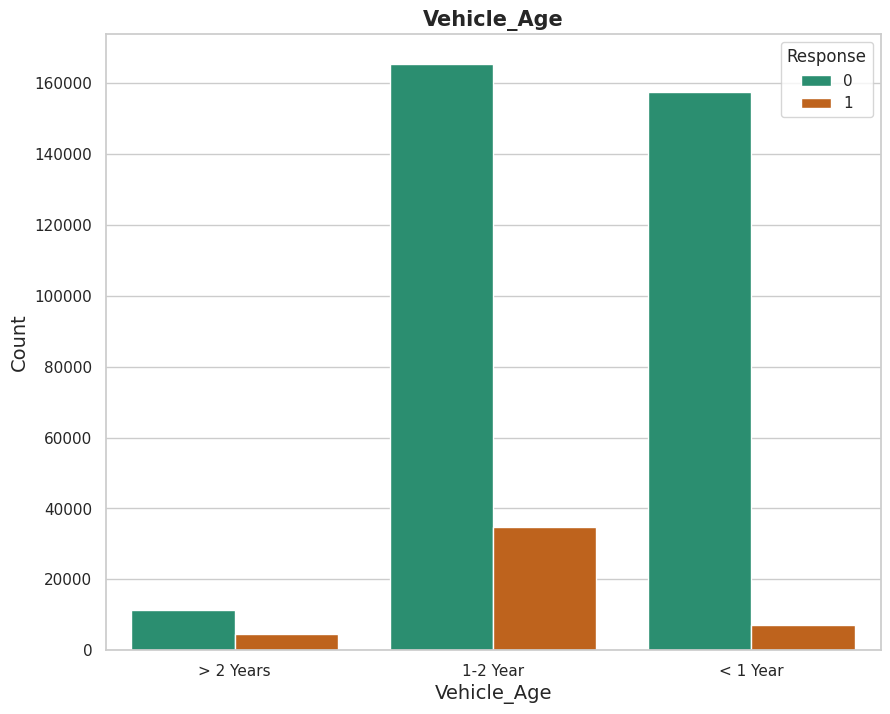

In [ ]:
vehicle_age_distribution(dataset)

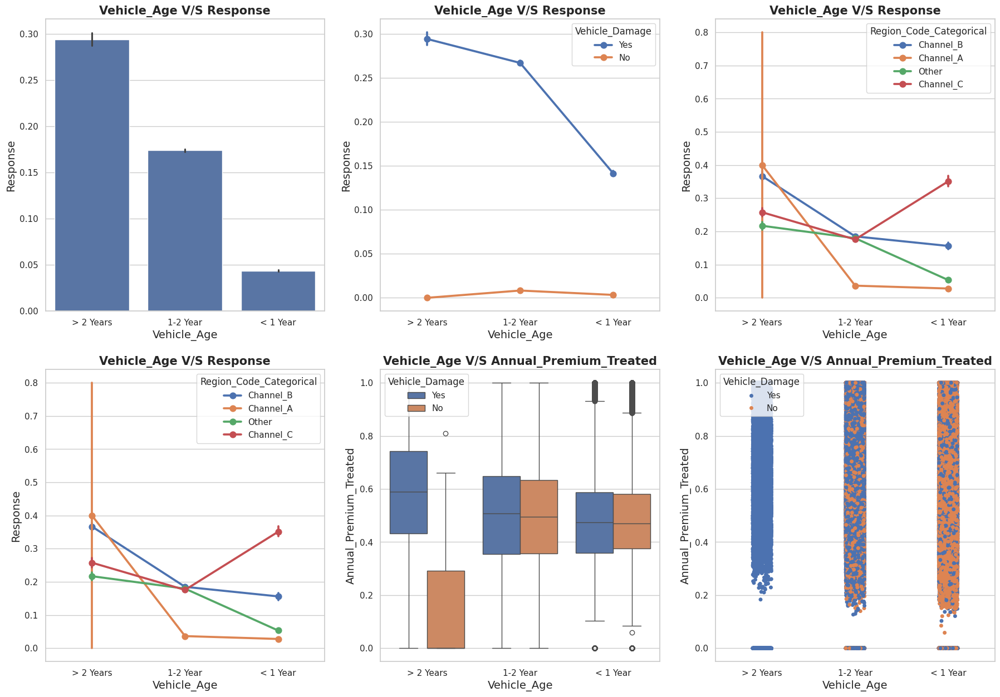

In [ ]:
show_vehicle_age_relation(dataset)

Observations:

1. **From the first bar plot:**
   - We observe the number of customers in each VehicleAge group who either took or did not take vehicle insurance.

2. **Regarding the first two plots of the above grid:**
   - These plots illustrate the likelihood of customers in each VehicleAge group taking vehicle insurance.

3. **The third plot of the above grid:**
   - This plot shows the probability of customers in each VehicleAge group taking vehicle insurance based on their RegionCode.

4. **The fourth plot of the above grid:**
   - This plot displays the probability of customers in each VehicleAge group taking vehicle insurance based on their PolicySalesChannel group.

5. **From the box plot of the above grid:**
   - We can observe the relationship between Vehicle_Age group and Annual_Premium, segmented by their Vehicle_Damage response.

6. **Regarding the strip plot:**
   - It indicates that customers with a vehicle age greater than 2 years have a higher likelihood of taking vehicle insurance.

# **Exploring Annual Premium**

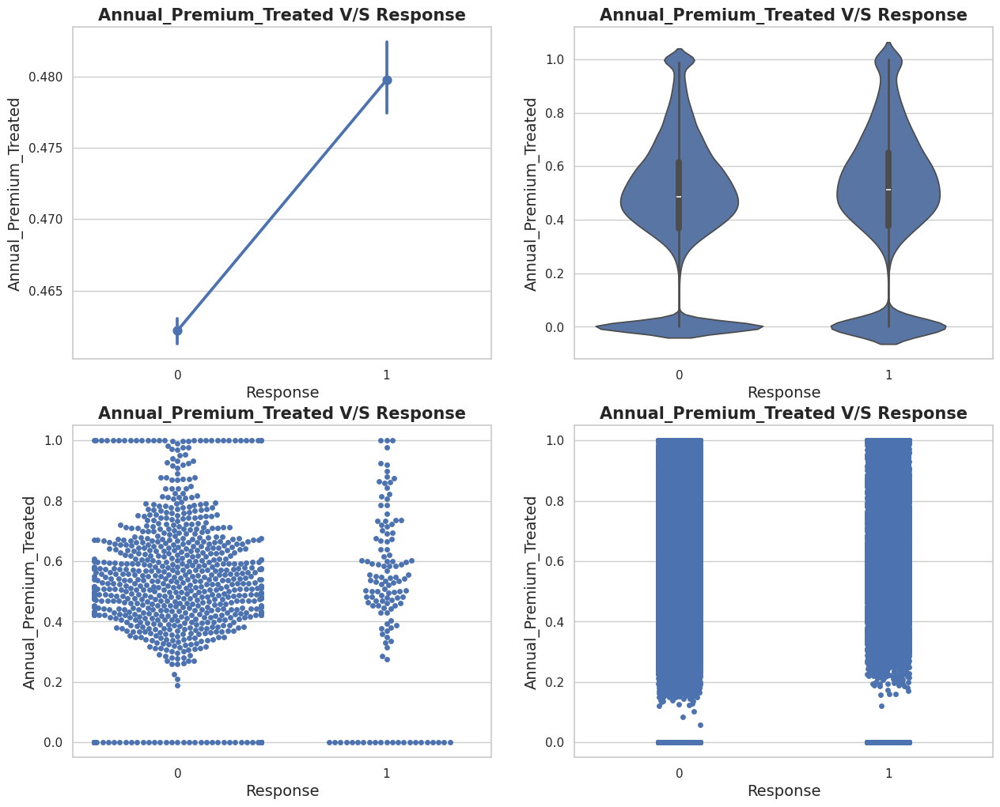

In [ ]:
show_annual_premium_relation(dataset)

**Observations:**
1. **From the point plot:**
   - It indicates that if the Annual_Premium is higher, customers are more likely to take the vehicle insurance.

2. **Regarding the second plot with the violin plot:**
   - Similarly, the violin plot also shows that as the Annual_Premium increases, customers are more inclined to take the vehicle insurance.

3. **The third plot:**
   - This plot displays the pattern of responses (taking or not taking vehicle insurance) based on different levels of Annual_Premium.

4. **Regarding the fourth plot with the strip plot:**
   - The strip plot shows the distribution of responses (taking or not taking vehicle insurance) across different levels of Annual_Premium.

Each point highlights a specific observation from the respective plots, providing a clear understanding of the relationship between Annual_Premium and the likelihood of customers taking vehicle insurance.

# **Annual Premium and Age**

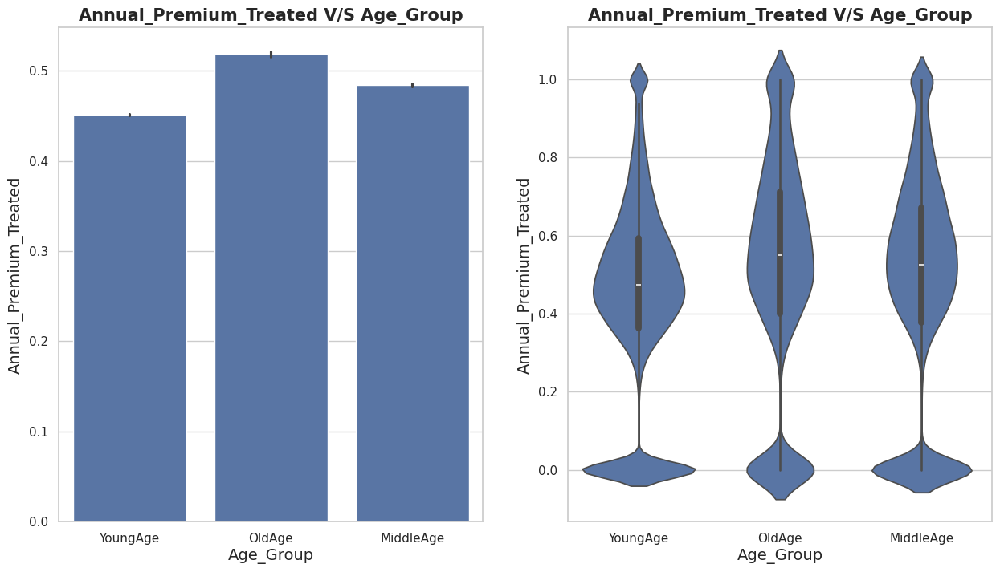

In [ ]:
show_annual_premium_with_age_group(dataset)

**Observations:**
- The preceding bar and violin plots illustrate the distribution of Annual_Premium based on Age_Group.

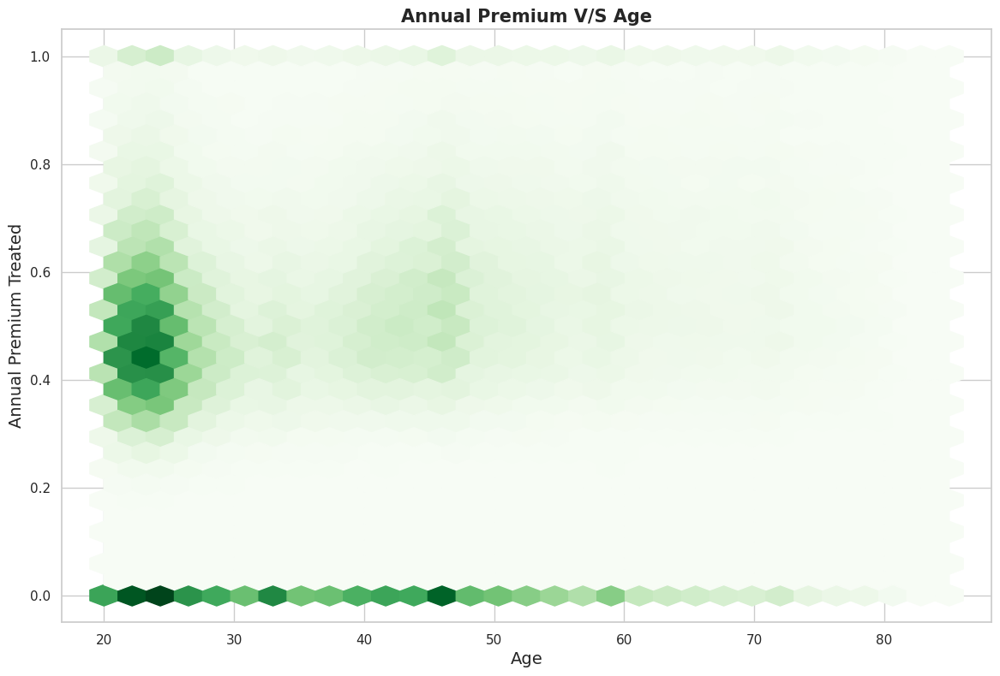

In [ ]:
show_age_annual_premium_relation(dataset)

**Observations:**
1. **First plot:**
   - The plot displays the distribution of Annual_Premium among individuals categorized by their Age.

2. **Second plot:**
   - In this plot, the distribution of Annual_Premium among individuals is categorized further by their Region_Code.

# **Age Group**

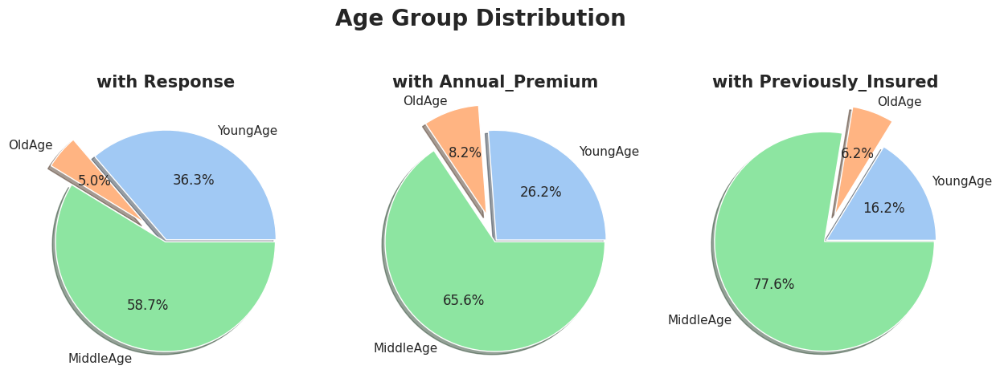

In [ ]:
age_group_distribution(dataset)

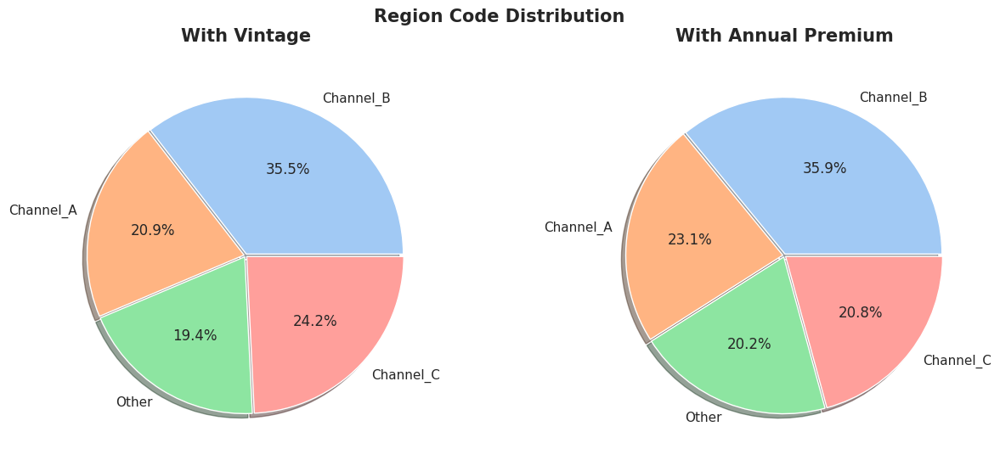

In [ ]:
show_region_code_distribution(dataset)

**Observations:**

- The above three pie plots show the distribution of **Age_Group** in the dataset based on:
  1. **Response**
  2. **Annual_Premium**
  3. **Previously_Insured**

- The above two pie plots show the distribution of **Region_Code** in the dataset based on:
  1. **Vintage**
  2. **Annual_Premium**

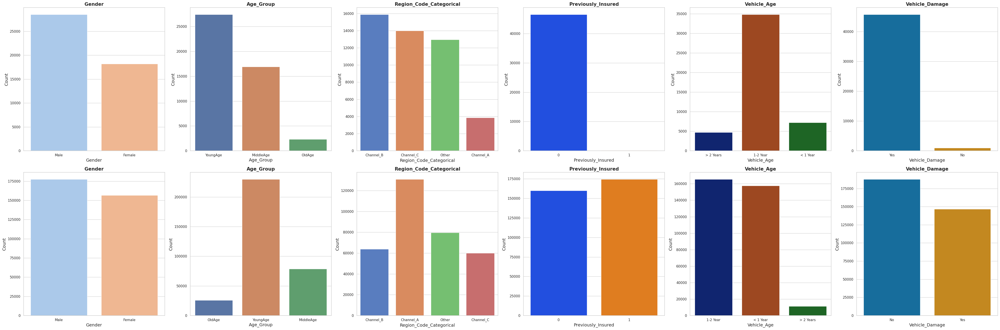

In [ ]:
count_each_categorical_feature(dataset)

# **Dropping Extra Columns**
- Having categorized the 'Age', 'Region_Code', 'Annual_Premium', 'Policy_Sales_Channel', and 'Vintage' features in our dataset, we can now proceed to drop these original features. Additionally, we can eliminate the 'ID' and 'Driving_License' columns, as they do not provide any valuable information for our analysis.

In [ ]:
dataset.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response', 'Annual_Premium_Treated',
       'Vintage_Treated', 'Age_Group', 'Region_Code_Categorical'],
      dtype='object')

In [ ]:
columns_to_drop = ['id', 'Age', 'Driving_License',
                'Region_Code', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage']
dataset.drop(columns = columns_to_drop, inplace = True)

# **Feature Selection**
- Let's examine the Kendall's correlation between the numerical features in our dataset. This analysis will help us understand the relationships between these variables.

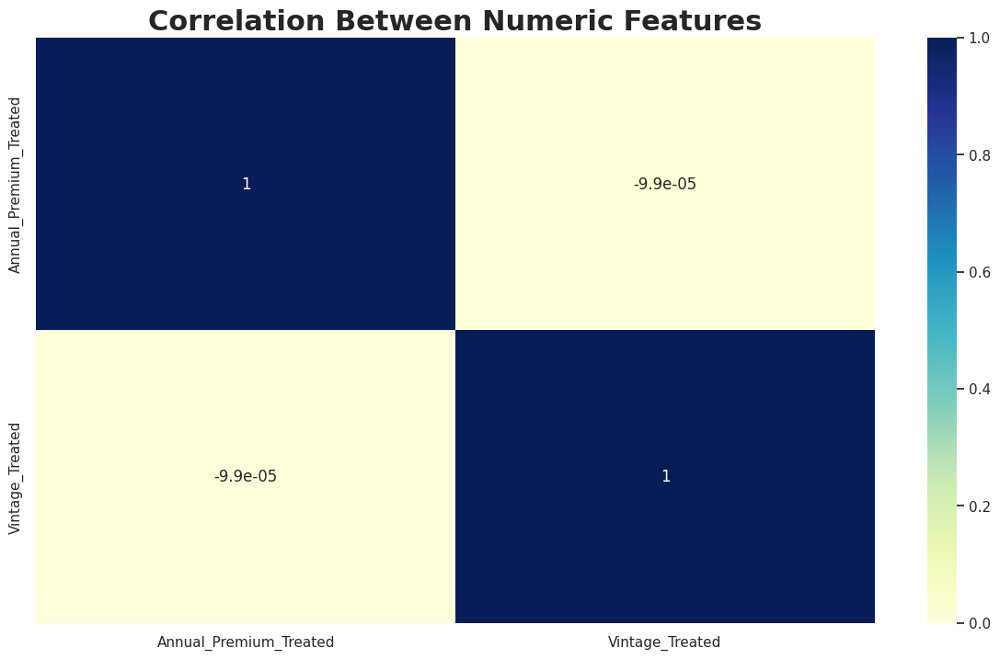

In [ ]:
def numeric_feature_selection(df):
    plt.rcParams['figure.figsize'] = 14.7,8.27
    numeric_features = ['Annual_Premium_Treated','Vintage_Treated']

    sns.heatmap(df[numeric_features].corr(method = 'kendall'),
                cmap="YlGnBu",annot=True)
    plt.title('Correlation Between Numeric Features', fontdict={'fontsize':22,'fontweight':'bold'})

numeric_feature_selection(dataset)

- We have identified two numeric features: Annual_Premium_Treated and Vintage_Treated. Since there is no significant correlation between these two features, we will proceed with both of them in our analysis.

# **Categorical Features**
- Let's evaluate the feature importance of the categorical features in our dataset. This analysis will help us determine which features are most influential.

In [ ]:
categorical_features = ['Gender','Age_Group','Region_Code_Categorical','Previously_Insured',
                        'Vehicle_Age','Vehicle_Damage','Policy_Sales_Channel_Categorical']

In [ ]:
def make_features_numeric(df):
    global numeric_df
    numeric_df = df.copy()
    numeric_df['Gender'] = numeric_df['Gender'].apply(lambda x: 1 if x == 'Male' else 0)
    numeric_df['Age_Group'] = numeric_df['Age_Group'].apply(lambda x: 1 if x == 'YoungAge' else 2 if x == 'MiddleAge' else 3)
    numeric_df['Vehicle_Age'] = numeric_df['Vehicle_Age'].apply(lambda x: 1 if x == 'New' else 2 if x == 'Latest' else 3)
    numeric_df['Vehicle_Damage'] = numeric_df['Vehicle_Damage'].apply(lambda x: 0 if x == 'Y' else 1)
    numeric_df['Region_Code_Categorical'] = numeric_df['Region_Code_Categorical'].apply(lambda x: 1 if x == 'A' else 2 if x == 'B' else 3)

make_features_numeric(dataset)

# **Mutual Information**
- Mutual information is a metric that quantifies how much information one random variable provides about another. It is one of several measures used to assess the relationship between variables.

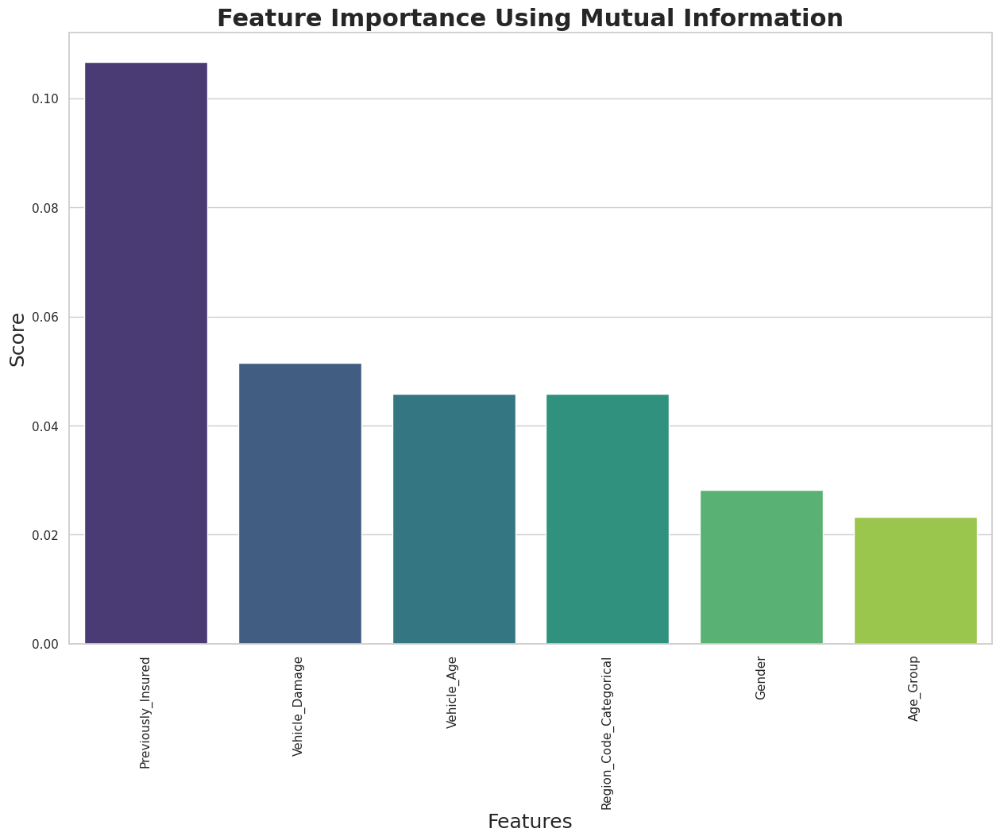

In [ ]:
def mutual_info(df):
    X = df.copy()
    y = X.pop("Response")
    X.drop(columns=['Annual_Premium_Treated', 'Vintage_Treated'], inplace=True)

    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

    high_score_features = []
    feature_scores = mutual_info_classif(x_train, y_train, random_state=0)

    column_score = {}
    columns = []
    scores = []
    for score, f_name in sorted(zip(feature_scores, x_train.columns), reverse=True):
        columns.append(f_name)
        scores.append(score)
        high_score_features.append(f_name)

    column_score['Feature'] = columns
    column_score['Score'] = scores

    return pd.DataFrame(data=column_score)

def show_feature_importance_through_mi(df):
    mi_df = mutual_info(df)
    plt.figure(figsize=(15, 10))
    sns.barplot(data=mi_df, x='Feature', y='Score', palette='viridis')
    plt.title('Feature Importance Using Mutual Information', fontdict={'fontsize': 22, 'fontweight': 'bold'})
    plt.xlabel('Features', fontdict={'fontsize': 18})
    plt.ylabel('Score', fontdict={'fontsize': 18})
    plt.xticks(rotation=90)
    plt.show()

show_feature_importance_through_mi(numeric_df)


- From the above bar plot, we can conclude that Previously_Insured is the most important feature and has the highest impact on the dependent variable.

# **One-Hot Encoding**
- One hot encoding is a technique used to convert categorical variables into a format suitable for machine learning algorithms, enhancing their predictive capability. It is particularly beneficial when categorical variables lack a natural ordinal relationship. By employing one hot encoding, the model avoids assuming any inherent order among categories, thereby mitigating potential issues such as reduced performance or unforeseen outcomes in predictions.

In [ ]:
dataset.columns

Index(['Gender', 'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage',
       'Response', 'Annual_Premium_Treated', 'Vintage_Treated', 'Age_Group',
       'Region_Code_Categorical'],
      dtype='object')

In [ ]:
columns_to_encode = ['Gender', 'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage',
                  'Age_Group', 'Region_Code_Categorical']

data_df = pd.get_dummies(data = dataset, columns=columns_to_encode)
data_df.head()

,Response,Annual_Premium_Treated,Vintage_Treated,Gender_Female,Gender_Male,Previously_Insured_0,Previously_Insured_1,Vehicle_Age_1-2 Year,Vehicle_Age_< 1 Year,Vehicle_Age_> 2 Years,Vehicle_Damage_No,Vehicle_Damage_Yes,Age_Group_MiddleAge,Age_Group_OldAge,Age_Group_YoungAge,Region_Code_Categorical_Channel_A,Region_Code_Categorical_Channel_B,Region_Code_Categorical_Channel_C,Region_Code_Categorical_Other
0,1,0.638245,0.716263,False,True,True,False,False,False,True,False,True,False,False,True,False,True,False,False
1,0,0.521510,0.598616,False,True,True,False,True,False,False,True,False,False,True,False,False,True,False,False
2,1,0.601797,0.058824,False,True,True,False,False,False,True,False,True,True,False,False,False,True,False,False
3,0,0.438540,0.667820,False,True,False,True,False,True,False,True,False,False,False,True,True,False,False,False
4,0,0.419591,0.100346,True,False,False,True,False,True,False,True,False,False,False,True,True,False,False,False


- Therefore, we have completed the feature selection phase for our dataset. Let us proceed to train the dataset using various machine learning algorithms.

# **Machine Learning Algorithms**

Let's proceed by applying various machine learning models to our dataset and evaluate their performance. We will begin by tuning the hyperparameters of these models and subsequently compare them to select the best-performing model based on elapsed time and evaluation metrics of the optimal parameters.

1. **Machine Learning Models to Evaluate:**
   - Decision Tree
   - Gaussian Naive Bayes
   - AdaBoost Classifier
   - Bagging Classifier
   - LightGBM
   - Logistic Regression

2. **Hyper-Parameter Tuning Methods:**
   - We explored various hyper-parameter tuning methods. Although all methods yielded similar results, GridSearchCV and RandomizedSearchCV required considerable time to train the models. In contrast, HalvingRandomizedSearchCV demonstrated the quickest training and prediction times. Therefore, we recommend selecting Halving_Randomized_Search_CV from the drop-down menu below for optimal efficiency.

3. **Tuning Methods Available:**
   - HalvingRandomizedSearchCV
   - GridSearchCV
   - RandomizedSearchCV

4. **Evaluation Metrics:**
   - Accuracy Score
   - Precision
   - Recall
   - F1 Score
   - ROC AUC Score
   - Log Loss

5. **Plots Included:**
   - After tuning each model's hyper-parameters, the following visualizations are provided:
     - ROC Curve: Illustrates the ROC Scores.
     - Parallel Coordinates Plot: Displays all combinations of hyper-parameters used during the model tuning process to identify the best parameters.

This structured presentation outlines the approach to training, tuning, evaluating, and comparing machine learning models based on elapsed time and performance metrics for optimal model selection.

In [ ]:
def plot_confusion_matrix_and_roc_curves(model, X_test, y_test, y_pred):

    fig, axes = plt.subplots(1,2, figsize=(22,5))

    cm = confusion_matrix(y_test, y_pred)
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ['{0:0.0f}'.format(value) for value in
                    cm.flatten()]
    group_percentages = ['{0:.2%}'.format(value) for value in
                        cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
            zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cm, ax = axes[0], annot=labels, fmt='',cmap='Blues')
    axes[0].set_title('Confusion Matrix', fontdict={'fontsize': 16, 'fontweight':'bold'})

    # predict probabilities
    pred_proba = model.predict_proba(X_test)

    # roc curve for models
    fpr, tpr, thresh = roc_curve(y_test, pred_proba[:,1], pos_label=1)

    # roc curve for tpr = fpr
    random_probs = [0 for i in range(len(y_test))]
    p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

    plt.subplot(1, 2, 2)
    # plot roc curves
    plt.plot(fpr, tpr,linestyle='--',color='red', label = type(model).__name__)

    plt.plot(p_fpr, p_tpr, linestyle='-', color='blue')
    # title
    plt.title('ROC curve', fontdict={'fontsize': 16, 'fontweight':'bold'})
    # x label
    plt.xlabel('False Positive Rate', fontdict={'fontsize': 12})
    # y label
    plt.ylabel('True Positive rate', fontdict={'fontsize': 12})

    plt.legend(loc='best')
    plt.show()

In [ ]:
def visualization(results_df, parameters):

    def shorten_param(param_name):
        if "__" in param_name:
            return param_name.rsplit("__", 1)[1]
        return param_name

    column_results = [f"param_{name}" for name in parameters.keys()]
    column_results += ["mean_test_score", "std_test_score", "rank_test_score"]

    results_df = results_df[column_results].sort_values("mean_test_score", ascending=False)
    results_df = results_df.rename(shorten_param, axis=1)

    for col in results_df.columns:
        if col == 'param_random_state':
            continue
        try:
            results_df[col] = results_df[col].astype(np.float64)
        except:
            continue

    fig = px.parallel_coordinates(
    results_df,
    color="mean_test_score",
    color_continuous_scale=px.colors.sequential.Viridis,
    title='Hyper Parameter Tuning',)
    fig.show()

In [ ]:
def evaluation_metrics(name, independent_feature_length , y_pred, y_test):

    metrics_dict = {}
    metrics_dict['Accuracy_Score'] = [accuracy_score(y_test,y_pred)]  #Accuracy Score
    metrics_dict['Precision'] = [precision_score(y_test,y_pred)] #Precision
    metrics_dict['Recall'] = [recall_score(y_test,y_pred)] #Recall
    metrics_dict['F1_Score'] = [f1_score(y_test,y_pred)] #F1 Score
    metrics_dict['ROC_AUC_Score'] = [roc_auc_score(y_test, y_pred)] #ROC AUC Score
    metrics_dict['Log_Loss'] = [log_loss(y_test, y_pred)] #Log Loss

    metrics_df = pd.DataFrame(metrics_dict)

    print(metrics_df)

In [ ]:
def hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model):

    if tuning_model == 'Halving_Randomized_Search_CV':
        tuned_model = HalvingRandomSearchCV(model, param_distributions = parameters, scoring = "accuracy", n_jobs=-1, factor=3, cv = 5 )

    elif tuning_model == 'Randomized_Search_CV':
        tuned_model = RandomizedSearchCV(model, param_distributions = parameters, scoring = 'accuracy', cv = 3, n_iter = 50, n_jobs=-1)

    else:
        tuned_mode = GridSearchCV(model, param_grid = parameters, scoring = 'accuracy', n_jobs=-1, cv = 3)


    start_time = time.time()

    tuned_model.fit(x_train, y_train)

    stop_time = time.time()

    print('*****'*10+f'\nBest Score for {type(model).__name__} : {tuned_model.best_score_}','\n---')
    print(f'Best Parameters for {type(model).__name__} : {tuned_model.best_params_}\n'+'-----'*10)

    print('Elapsed Time:',time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))
    print('======'*5)

    return tuned_model

In [ ]:
def perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, tuning_model):
    print('-----'*10+f'\n{type(model).__name__}\n'+'-----'*10)

    model.fit(x_train, y_train)
    untuned_pred = model.predict(x_test)

    # Evaluation Metrics before tuning
    print(f'\nEvaluation of {type(model).__name__} before tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__, len(list(x_train.columns)), untuned_pred, y_test)

    print()
    plot_confusion_matrix_and_roc_curves(model, x_test, y_test, untuned_pred)

    # Hyper-parameter tuning
    tuned_model = hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model)
    tuned_pred = tuned_model.predict(x_test)

    # Evaluation Metrics after tuning
    print(f'\nEvaluation of {type(model).__name__} after tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__,len(list(x_train.columns)), tuned_pred, y_test)

    print()
    plot_confusion_matrix_and_roc_curves(tuned_model.best_estimator_, x_test, y_test, tuned_pred)
    visualization(pd.DataFrame(tuned_model.cv_results_), parameters)

In [ ]:
def ml_algorithm_implementation(df, model, parameters, tuning_model, feature_importance = False):

    if feature_importance == False:
        print('########'*8+'\n     <<<< '+f'Tuning Model: {tuning_model}'+' >>>>\n'+'********'*8)

    x = data_df.iloc[:,1:]
    y = data_df['Response']

    # Train Test Split
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state=57)

    if feature_importance == True:
        model.fit(x_train, y_train)
        return x_train, y_train, model

    perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, tuning_model)

In [ ]:
#@title Keep it Halving_Randomized_Search_CV!! Other methods are time consuming.
Tuning_Method = "Grid_Search_CV" #@param ["Halving_Randomized_Search_CV", "Grid_Search_CV", "Randomized_Search_CV"]


# **Decision Tree**
- The decision tree is widely recognized as a robust and influential tool for classification and prediction tasks. It adopts a tree-like structure where each internal node signifies a test on an attribute, every branch represents the outcome of that test, and each leaf node, or terminal node, contains a specific class label. This hierarchical framework enables intuitive and insightful decision-making processes in various domains of data analysis and machine learning.

################################################################
     <<<< Tuning Model: Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
DecisionTreeClassifier
--------------------------------------------------

Evaluation of DecisionTreeClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.828903   0.282055  0.261684  0.271488       0.584639   6.16695



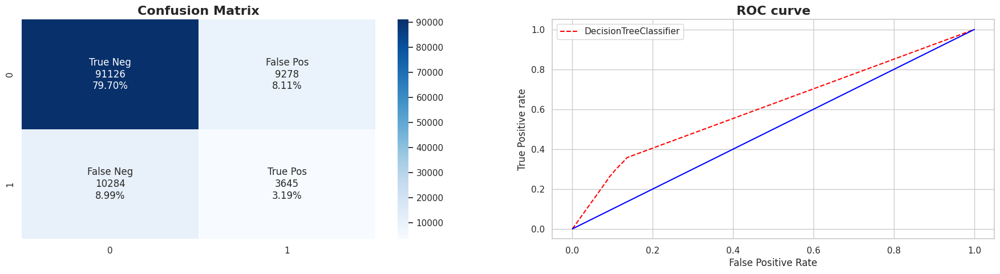

**************************************************
Best Score for DecisionTreeClassifier : 0.8771891022116204 
---
Best Parameters for DecisionTreeClassifier : {'splitter': 'random', 'random_state': 23, 'min_weight_fraction_leaf': 0.0, 'min_samples_leaf': 4, 'max_leaf_nodes': 30, 'max_features': 'auto', 'max_depth': 7}
--------------------------------------------------
Elapsed Time: 00:00:23

Evaluation of DecisionTreeClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878198   0.714286  0.000359  0.000718        0.50017  4.390193



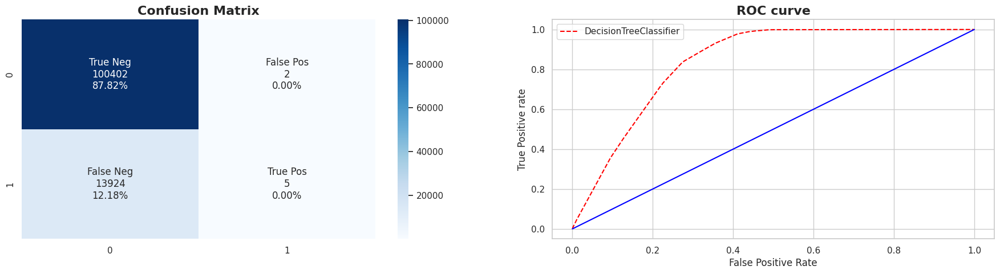

In [ ]:
parameters_decision_tree = {"splitter":["best","random"],
            "max_depth" : [None,5,7,9],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0.0, 0.3,0.4,0.5],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,30,40,50,60],
           'random_state':[23]}

ml_algorithm_implementation(data_df, DecisionTreeClassifier(), parameters_decision_tree, Tuning_Method, False)

# **Gaussian Naive Bayes**
- Gaussian Naive Bayes is a specialized variant of the Naive Bayes algorithm tailored for continuous data, adhering to Gaussian (normal) distribution principles. Naive Bayes algorithms, including Gaussian Naive Bayes, are a class of supervised machine learning methods grounded in Bayes' theorem. Despite its simplicity, Naive Bayes exhibits robust performance across various classification tasks, emphasizing its practical utility and efficiency in real-world applications.

################################################################
     <<<< Tuning Model: Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
GaussianNB
--------------------------------------------------

Evaluation of GaussianNB before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score   Log_Loss
0        0.688305   0.269123  0.908321  0.415221       0.783052  11.234619



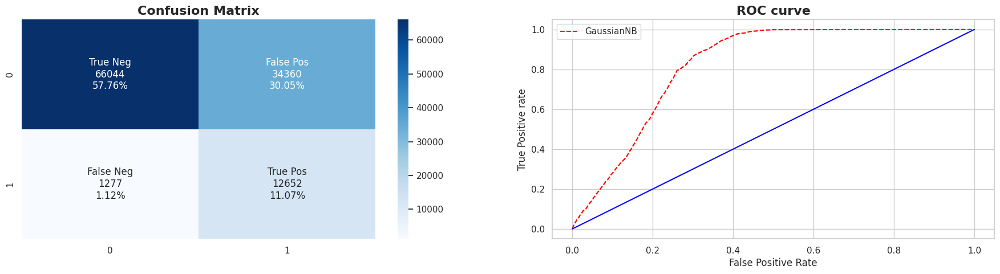

**************************************************
Best Score for GaussianNB : 0.717583290969273 
---
Best Parameters for GaussianNB : {'var_smoothing': 0.8111308307896871}
--------------------------------------------------
Elapsed Time: 00:00:25

Evaluation of GaussianNB after tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.718533   0.283272  0.856343  0.425719       0.777879  10.14511



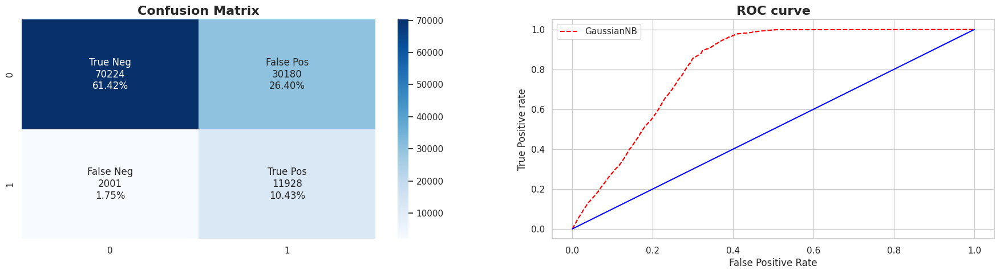

In [ ]:
parameters_NB = {'var_smoothing': np.logspace(0,-9, num=100)}

ml_algorithm_implementation(data_df, GaussianNB(), parameters_NB, Tuning_Method, False)

# **AdaBoost Classifier**
- AdaBoost, short for Adaptive Boosting, is an ensemble method in machine learning known for its boosting technique. It dynamically adjusts weights assigned to each instance during training, placing greater emphasis on instances that were previously misclassified. This adaptive approach enhances the model's ability to focus on challenging instances, thereby improving overall predictive accuracy and robustness in classification tasks.

################################################################
     <<<< Tuning Model: Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
AdaBoostClassifier
--------------------------------------------------

Evaluation of AdaBoostClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



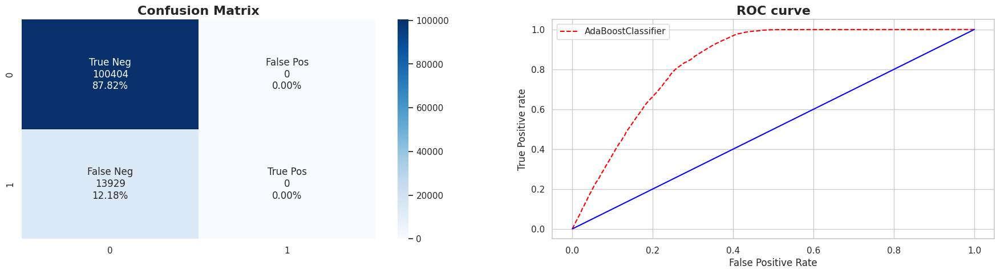

**************************************************
Best Score for AdaBoostClassifier : 0.8771253785632213 
---
Best Parameters for AdaBoostClassifier : {'random_state': 2, 'n_estimators': 400, 'learning_rate': 0.5}
--------------------------------------------------
Elapsed Time: 00:23:41

Evaluation of AdaBoostClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



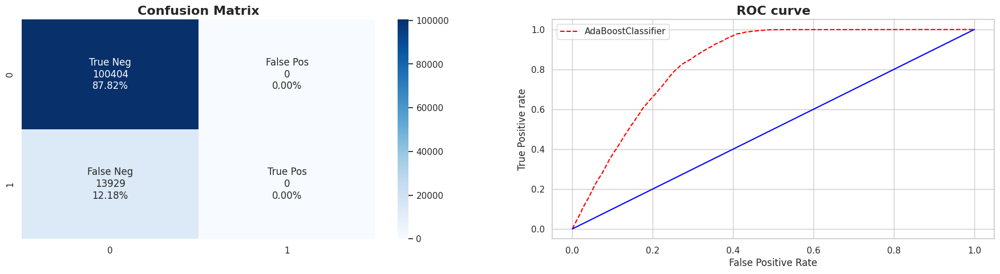

In [ ]:
parameters_ada = {'n_estimators':[10, 100, 200,400],
              'learning_rate':[0.001, 0.01, 0.1, 0.2, 0.5],
              'random_state':[2]}

ml_algorithm_implementation(data_df, AdaBoostClassifier(), parameters_ada, Tuning_Method, False)

# **Bagging Classifier**
- A Bagging classifier is an ensemble meta-estimator used in machine learning, which trains multiple base classifiers on random subsets of the original dataset. It aggregates the predictions of these individual classifiers, typically through voting or averaging, to produce a final prediction. This approach enhances the model's stability and accuracy by reducing variance and mitigating overfitting, making it effective for improving prediction performance across diverse datasets and learning scenarios.

################################################################
     <<<< Tuning Model: Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
BaggingClassifier
--------------------------------------------------

Evaluation of BaggingClassifier before tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.853271   0.303574  0.157944  0.207782       0.553838   5.28866



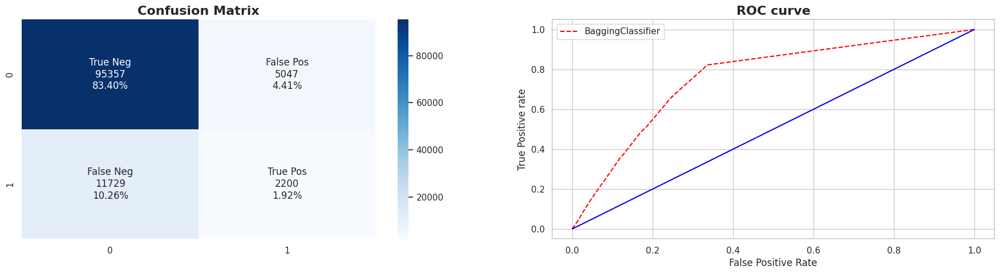

**************************************************
Best Score for BaggingClassifier : 0.8520594037988577 
---
Best Parameters for BaggingClassifier : {'random_state': 26, 'n_estimators': 400}
--------------------------------------------------
Elapsed Time: 00:36:05

Evaluation of BaggingClassifier after tuning:
--------------------------------------------------
   Accuracy_Score  Precision    Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.855142   0.313448  0.158805  0.210807       0.555275  5.221196



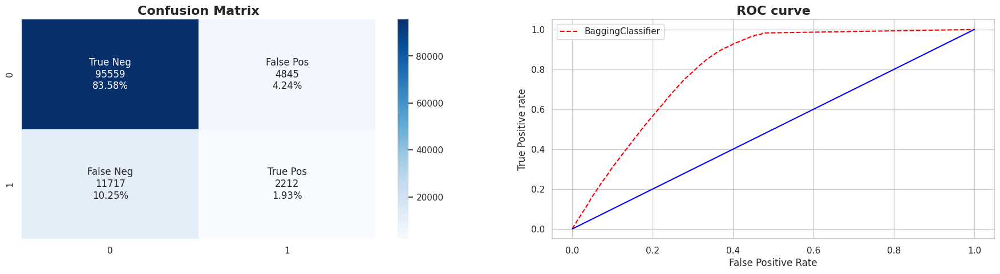

In [ ]:
parameters_bagging = {'n_estimators':[10, 100, 200, 400],
                      'random_state':[26]}

ml_algorithm_implementation(data_df, BaggingClassifier(), parameters_bagging, Tuning_Method, False)

# **LightGBM Classifier**
- LightGBM, short for Light Gradient Boosting Machine, is a distributed gradient boosting framework known for its efficiency and performance. It leverages Histogram-based splitting, Gradient-based One-Side Sampling (GOSS), and Exclusive Feature Bundling (EFB), enhancing its speed and scalability. These techniques collectively contribute to LightGBM's capability to handle large datasets effectively while maintaining high accuracy and computational efficiency.

################################################################
     <<<< Tuning Model: Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
LGBMClassifier
--------------------------------------------------
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 32781, number of negative: 233995
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009056 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 532
[LightGBM] [Info] Number of data points in the train set: 266776, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.122878 -> initscore=-1.965451
[LightGBM] [Info] Start training from score -1.965451

Evaluation of LGBMClassifier before tuning:
-------------------

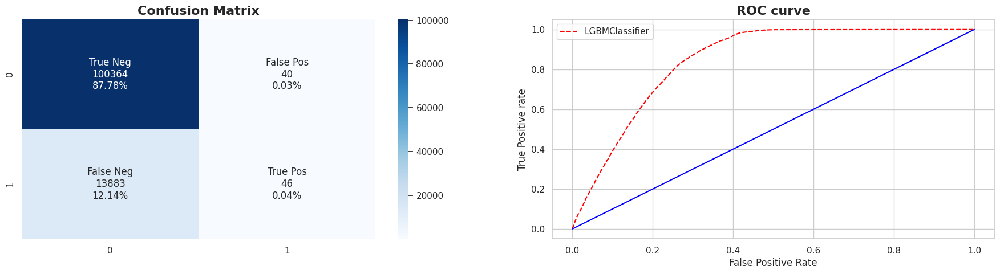

[LightGBM] [Warning] Unknown parameter: max_depths
[LightGBM] [Warning] min_data_in_leaf is set=250, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=250
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Unknown parameter: max_depths
[LightGBM] [Warning] min_data_in_leaf is set=250, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=250
[LightGBM] [Info] Number of positive: 32781, number of negative: 233995
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 532
[LightGBM] [Info] Number of data points in the train set: 266776, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.122878 -> initscore=-1.965451
[LightGBM] [Info] Start training from score -1.965451
***********

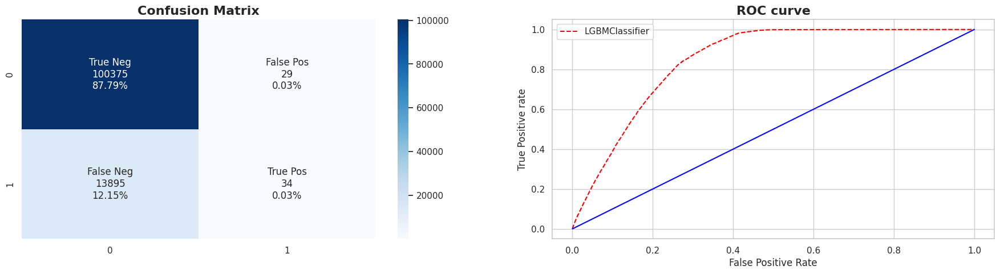

In [ ]:
parameters_lightgbm = {
    'max_depths': np.linspace(1, 32, 32, endpoint=True),
    'min_data_in_leaf':[100, 200, 250, 300],
    'n_estimators':[50,100, 120,150,200],
    'learning_rate':[.001,0.01,.1]
}

ml_algorithm_implementation(data_df, lgb.LGBMClassifier(), parameters_lightgbm, Tuning_Method, False)

# **Logistic Regression**
- The logistic regression model is a binary classification method where the probability of one of the two possible outcomes of the target variable is modeled as a linear combination of input variables, transformed through the logistic function. This approach assumes a probabilistic relationship between the inputs and the output, allowing for effective prediction and inference in classification tasks.

################################################################
     <<<< Tuning Model: Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
LogisticRegression
--------------------------------------------------

Evaluation of LogisticRegression before tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



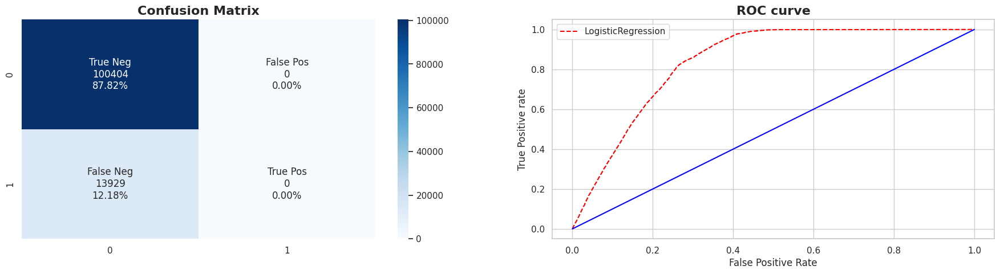

**************************************************
Best Score for LogisticRegression : 0.877121630128193 
---
Best Parameters for LogisticRegression : {'solver': 'newton-cg', 'random_state': 2, 'penalty': 'l2', 'C': 100}
--------------------------------------------------
Elapsed Time: 00:05:34

Evaluation of LogisticRegression after tuning:
--------------------------------------------------
   Accuracy_Score  Precision  Recall  F1_Score  ROC_AUC_Score  Log_Loss
0        0.878172        0.0     0.0       0.0            0.5  4.391139



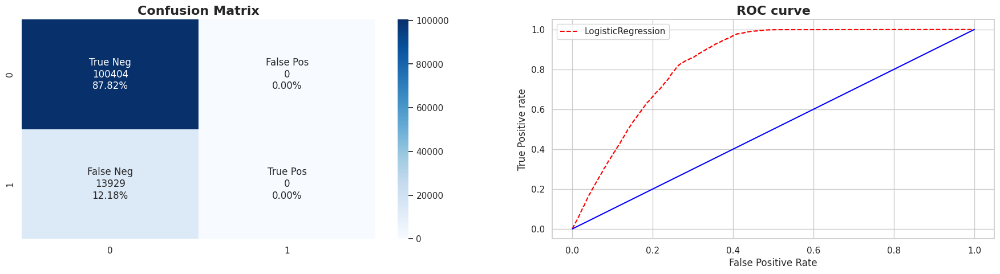

In [ ]:
parameters_logistic = {'solver' : ['newton-cg', 'lbfgs', 'liblinear','sag','saga'],
                        'penalty' : ['l2'],
                        'C' : [100, 10, 1.0, 0.1, 0.01, 0.001],
                       'random_state':[2]}

ml_algorithm_implementation(data_df, LogisticRegression(), parameters_logistic, Tuning_Method, False)

# **Best Model**
- Based on our experimentation with various models for training and predicting outputs, we have determined that the Bagging Classifier performs best on our dataset. The optimal parameter configuration for this model is {'n_estimators': 200}. It achieves an Accuracy Score of 0.85, with Precision of 0.31, Recall of 0.15, F1 Score of 0.20, ROC AUC Score of 0.55, and Log Loss of 5.22. The model's elapsed time for training and evaluation is 36 minutes and 05 seconds.

- While other models may exhibit higher Accuracy Scores, their Precision and Recall metrics are consistently zero, indicating an inability to correctly predict positive outcomes (customers interested in vehicle insurance). As classification accuracy can be misleading when classes are imbalanced, our focus on Precision and Recall highlights the Bagging Classifier's ability to predict positive instances effectively.

- Therefore, based on its overall performance metrics and ability to address the dataset's specific challenges, the Bagging Classifier emerges as the optimal choice for our classification task.

**Note:** Results may vary slightly with each run due to the randomized nature of the Halving_Randomized_Search_CV method used for hyperparameter tuning.

# **Extracting Feature Importance**

- Now that we have identified our best model along with its optimal hyperparameter values, let's examine the feature importance within our dataset. Understanding the importance of features helps us discern which variables contribute most significantly to the model's predictions. This analysis aids in interpreting the factors driving the model's performance and provides insights into the underlying relationships between input variables and the target outcome.

In [ ]:
def feature_plot(importances, X_train, y_train):

    # Display the five most important features
    indices = np.argsort(importances)[::-1]
    columns = X_train.columns.values[indices[:5]]
    values = importances[indices][:5]

    # Creat the plot
    fig = plt.figure(figsize = (9,5))
    plt.title("Normalized Weights for First Five Most Predictive Features", fontsize = 16)
    plt.bar(np.arange(5), values, width = 0.2, align="center", color = '#00A000', \
          label = "Feature Weight")
    plt.bar(np.arange(5) - 0.2, np.cumsum(values), width = 0.2, align = "center", color = '#00A0A0', \
          label = "Cumulative Feature Weight")
    plt.xticks(np.arange(5), columns)
    plt.xlim((-0.5, 4.5))
    plt.ylabel("Weight", fontsize = 12)
    plt.xlabel("Feature", fontsize = 12)

    plt.legend(loc = 'upper center')
    plt.tight_layout()
    plt.show()

def show_feature_importance():
    x_train, y_train, model = ml_algorithm_implementation(data_df, BaggingClassifier(n_estimators=200, random_state=23),
                                None, None, True)

    importances = np.mean([
        tree.feature_importances_ for tree in model.estimators_
        ], axis=0)
    feature_plot(importances, x_train, y_train)

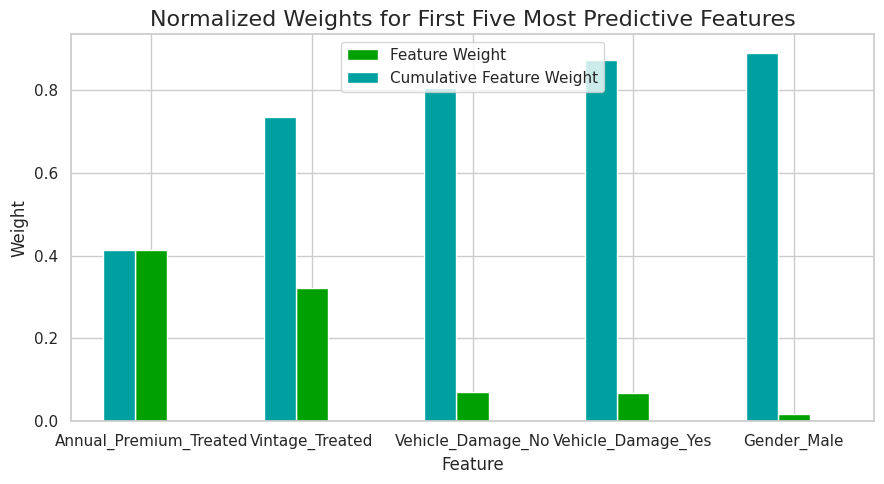

In [ ]:
show_feature_importance()

**Observations:**

- Annual_Premium_Treated exerts the strongest influence on the predictions within the model.
- Although Gender_Male carries the highest individual feature weight, its cumulative impact on the predictions is relatively lower compared to other factors. This highlights the nuanced role of this feature in the overall predictive outcome.

# **Conclusion**

1. **Dataset Preparation:**
   - We began by loading our dataset and conducted checks for null values and duplicates, finding none. Therefore, no treatment for these issues was necessary.
   - Prior to data processing, we applied feature scaling techniques to normalize our data. This step ensures all features are on the same scale, facilitating better performance of machine learning algorithms.

2. **Exploratory Data Analysis (EDA):**
   - During EDA, we categorized Age into YoungAge, MiddleAge, and OldAge groups, and Region_Code into Region_A, Region_B, and Region_C categories.
   - Policy_Sales_Channel was also categorized into channel_A, channel_B, and channel_C & other based on observed patterns.
   - Insights from EDA revealed that younger customers (YoungAge) showed higher interest in vehicle insurance. Additionally, customers with vehicles older than 2 years and those with damaged vehicles were more likely to express interest in vehicle insurance.

3. **Feature Selection:**
   - For feature selection, we utilized Kendall's rank correlation coefficient for numerical features and Mutual Information for categorical features.
   - The analysis identified Previously_Insured as the most important feature with the highest impact on the dependent variable. It also highlighted the absence of correlation between the two numerical features.

4. **Machine Learning Algorithms and Model Selection:**
   - We applied various machine learning algorithms to predict customer interest in Vehicle Insurance.
   - Naive Bayes initially yielded an accuracy score of 68%, which improved to 72% after hyperparameter tuning.
   - Decision Tree Classifier, AdaBoost, Bagging Classifier, and LightGBM achieved accuracy scores ranging from 82% to 87%.
   - Considering the imbalance in class distribution within our dataset, we prioritized precision and recall metrics alongside accuracy. The model with the highest accuracy score of 85% was selected as the best performer.

This comprehensive approach from data preprocessing, through exploratory analysis, feature selection, and model evaluation underscores our methodical exploration and decision-making process in predicting customer interest in vehicle insurance.